In [1]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns
import folium
import folium.plugins
sns.set()


## Setup


In [2]:
PATH = './data/cleaned_ufo_data/data_geocoded.csv'
# Read csv file into dataframe
df = pd.read_csv(PATH, header=0, names=[
                 'DateTime', 'City', 'State', 'Country', 'location', 'geocode', 'lat', 'long'])


In [3]:
df


,DateTime,City,State,Country,location,geocode,lat,long
0,2021-09-30 22:50:00,Ocala,FL,USA,"Ocala,FL,USA","(29.1871986, -82.14009229999999)",29.187199,-82.140092
1,2021-09-30 22:49:00,Atlanta,GA,USA,"Atlanta,GA,USA","(33.748752, -84.38768449999999)",33.748752,-84.387684
2,2021-09-30 21:45:00,Lakeland,GA,USA,"Lakeland,GA,USA","(31.0410373, -83.0751471)",31.041037,-83.075147
3,2021-09-30 21:25:00,Grand Haven,MI,USA,"Grand Haven,MI,USA","(43.0630734, -86.22838639999999)",43.063073,-86.228386
4,2021-09-30 20:59:00,Lewis Center,OH,USA,"Lewis Center,OH,USA","(40.1983884, -83.0100987)",40.198388,-83.010099
...,...,...,...,...,...,...,...,...
14283,2021-02-01 18:50:00,Frisco,TX,USA,"Frisco,TX,USA","(33.1506744, -96.82361159999999)",33.150674,-96.823612
14284,2021-02-01 17:02:00,Jonesboro,AR,USA,"Jonesboro,AR,USA","(35.835696, -90.7051346)",35.835696,-90.705135
14285,2021-02-01 15:36:00,Springfield,MO,USA,"Springfield,MO,USA","(37.2089572, -93.29229889999999)",37.208957,-93.292299
14286,2021-02-01 15:25:00,Elizabeth,CO,USA,"Elizabeth,CO,USA","(39.3602662, -104.596915)",39.360266,-104.596915


In [4]:
# get only column lat and long
features = df[['lat', 'long']]
features


,lat,long
0,29.187199,-82.140092
1,33.748752,-84.387684
2,31.041037,-83.075147
3,43.063073,-86.228386
4,40.198388,-83.010099
...,...,...
14283,33.150674,-96.823612
14284,35.835696,-90.705135
14285,37.208957,-93.292299
14286,39.360266,-104.596915


## Elbow Test

This test is used to find the optimal number of clusters for the K-means cluster


In [5]:
num_clusters = range(1, 10)
# An list of kmeans clusters each with a different number of clusters
kmeans_list = [KMeans(n_clusters=i, random_state=7, init='k-means++')
               for i in num_clusters]


In [6]:
score = [kmeans_list[i].fit(features).score(features) for i in range(
    len(kmeans_list))]  # A list of scores for each kmeans cluster


### Conclusion

Based on the Elbow test, we identified 4 as the optimal number of cluster. The reason is that as the number of clusters go beyond 4, there is no more substantial improvement on the score.


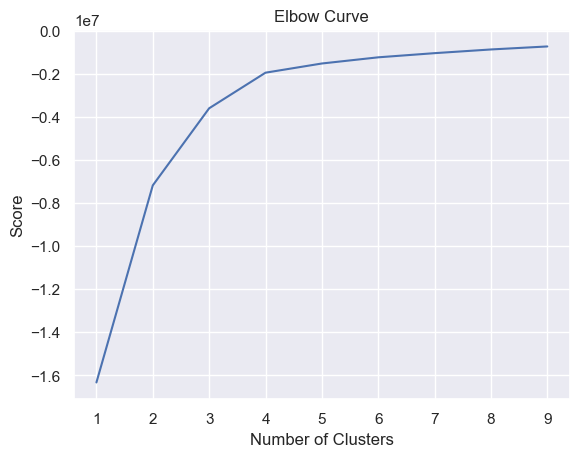

In [7]:
plt.plot(num_clusters, score)
plt.title('Elbow Curve')
plt.xlabel('Number of Clusters')
plt.ylabel('Score')
plt.show()


## K-means Cluster Training and Labelling


In [8]:
# create kmeans model/object
kmeans = KMeans(
    init='k-means++',
    n_clusters=4,
    random_state=7
)


In [9]:
# fit and predict the clusters
labels = kmeans.fit_predict(features)


In [10]:
# add a new cluster column
df['cluster'] = labels


In [11]:
# display the number of member each clustering
clusters = df.groupby('cluster')['lat'].count()
clusters


cluster
0    4556
1    9215
2     172
3     345
Name: lat, dtype: int64

In [12]:
cluster_centers = pd.DataFrame(
    kmeans.cluster_centers_, columns=['lat', 'long'])
cluster_centers


,lat,long
0,39.853459,-116.970749
1,37.903833,-82.775157
2,-2.801175,113.895411
3,47.488634,4.892289


In [13]:
kmeans.cluster_centers_


array([[  39.85345873, -116.97074902],
       [  37.90383289,  -82.77515651],
       [  -2.80117463,  113.89541093],
       [  47.48863397,    4.89228874]])

## Displaying the Clusters


In [14]:
colors = ['red', 'blue', 'green', 'purple']
map = folium.Map(location=[30, 31], zoom_start=2,
                 min_zoom=1, max_zoom=14, tiles='Stamen Terrain')


### Add clusters to the map


In [15]:
for _, row in df.iterrows():
    folium.CircleMarker(
        location=[row["lat"], row["long"]],
        radius=5,
        weight=2,
        fill=True,
        tooltip=[row["location"]][0],
        fill_color=colors[int(row["cluster"])],
        color=colors[int(row["cluster"])]
    ).add_to(map)


In [16]:
map


In [17]:
map.save('global_cluster.html')
